In [1]:
from astropy.visualization import make_lupton_rgb
from astropy.io import fits
import glob
import pylab
import numpy
from scipy.ndimage import shift

In [23]:
files=glob.glob("orion-?.fits")
delta = 1.0
margin = 500
xc = 1750
yc = 1190
R = fits.open(files[0])[0].data[(yc-margin)*2:(yc+margin)*2,(xc-margin)*2:(xc+margin)*2]
G = (shift(fits.open(files[1])[0].data[(yc-margin)*2:(yc+margin)*2,(xc-margin)*2:(xc+margin)*2],(0.4*delta,0.9*delta))
    +shift(fits.open(files[2])[0].data[(yc-margin)*2:(yc+margin)*2,(xc-margin)*2:(xc+margin)*2],(1.5*delta,1*delta)))*0.5
B = shift(fits.open(files[3])[0].data[(yc-margin)*2:(yc+margin)*2,(xc-margin)*2:(xc+margin)*2],(1.3*delta,0.3*delta))


R = fits.open(files[0])[0].data[(yc-margin)*2:(yc+margin)*2,(xc-margin)*2:(xc+margin)*2]
G = shift(fits.open(files[2])[0].data[(yc-margin)*2:(yc+margin)*2,(xc-margin)*2:(xc+margin)*2],(1.5*delta,1*delta))
B = (shift(fits.open(files[1])[0].data[(yc-margin)*2:(yc+margin)*2,(xc-margin)*2:(xc+margin)*2],(0.4*delta,0.9*delta))
    +shift(fits.open(files[3])[0].data[(yc-margin)*2:(yc+margin)*2,(xc-margin)*2:(xc+margin)*2],(1.3*delta,0.3*delta)))*0.5


In [24]:
numpy.array([[ 0.8293, -0.1789, -0.1094],
             [-0.5025,  1.2925,  0.2327],
             [-0.1199,  0.2769,  0.6108],
             [ 0.,      0.,      0.    ]])

array([[ 0.8293, -0.1789, -0.1094],
       [-0.5025,  1.2925,  0.2327],
       [-0.1199,  0.2769,  0.6108],
       [ 0.    ,  0.    ,  0.    ]])

Lupton's formula is defined in https://arxiv.org/pdf/astro-ph/0312483.pdf

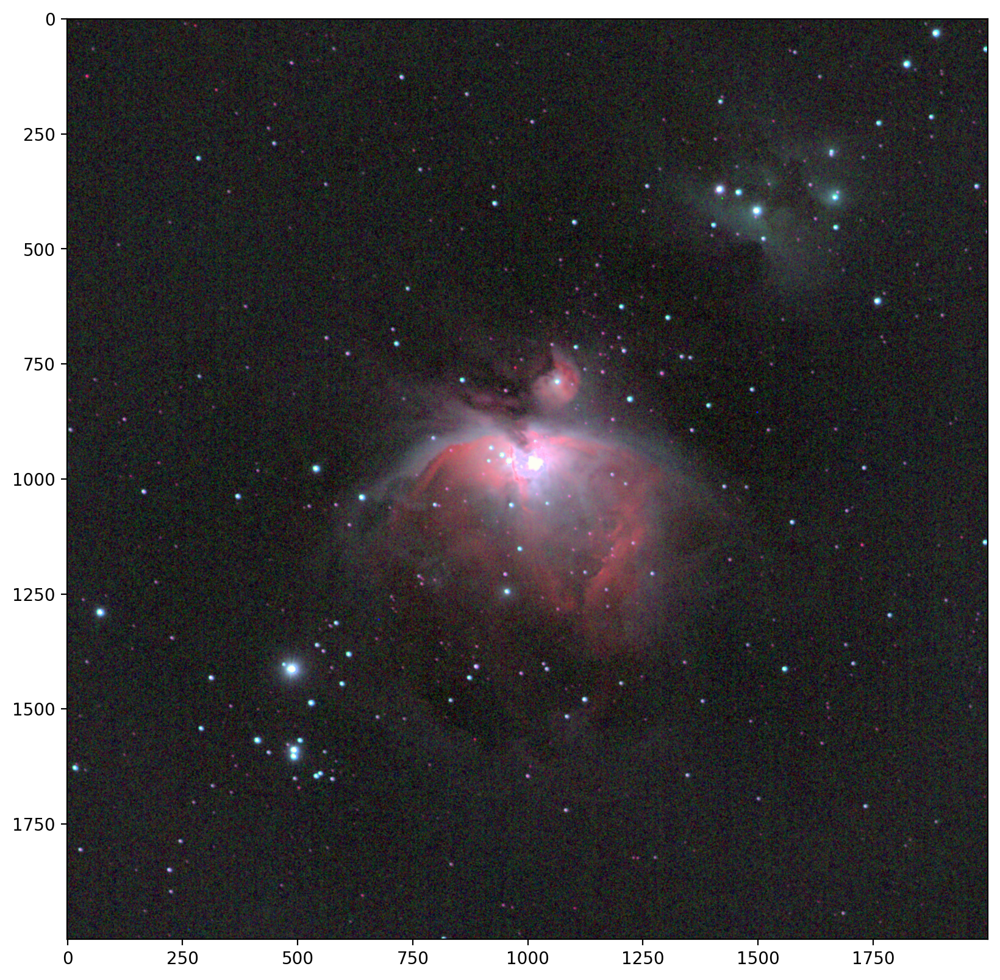

In [27]:
from skimage.filters import laplace,unsharp_mask,wiener,gaussian

pylab.figure(figsize=(10,10),dpi=200,facecolor="w")
image = make_lupton_rgb(
    R,
    G,
    B,
    minimum=-50,Q=6, stretch=400 )
pylab.imshow(image,origin="upper")

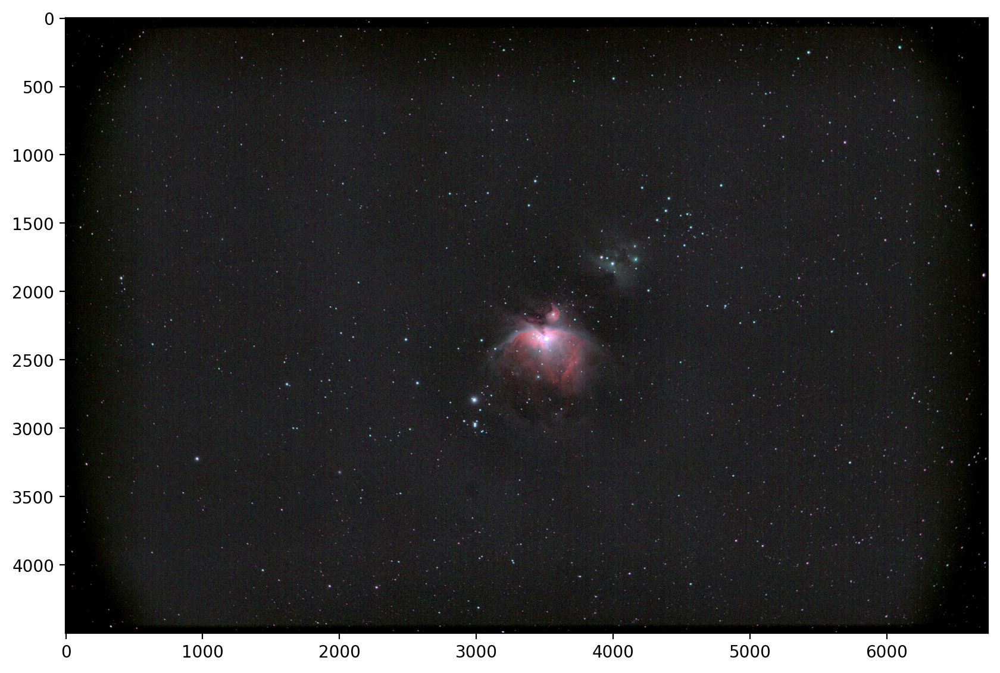

In [22]:
delta = 1.0
R = fits.open(files[0])[0].data
G = shift(fits.open(files[2])[0].data,(1.5*delta,1*delta))
B = (shift(fits.open(files[1])[0].data,(0.4*delta,0.9*delta))
    +shift(fits.open(files[3])[0].data,(1.3*delta,0.3*delta)))*0.5


options={ "sigma":0, "truncate": 50 }

pylab.figure(figsize=(10,10),dpi=200,facecolor="w")
image = make_lupton_rgb(
    R,
    G,
    B,
    minimum=-50,Q=6, stretch=400, filename="color.jpg" )
pylab.imshow(image,origin="upper")